# AMORE — pathway benchmark on alanine dipeptide (the simplex views)

A $k=3$ ISOKANN model maps configurations to the membership **simplex** $\Delta^2$
($\chi_m\ge0,\ \sum_m\chi_m=1$): the three metastable states are its **vertices**, and the
pairwise interconversions are its **edges**.  This notebook builds the AMORE pipeline around
that geometry:

1. **Sampling** — well-tempered metadynamics in $(\phi,\psi)$, the FES, and 0.1 ps Koopman
   bursts on a grid.
2. **ISOKANN** — three softmax memberships $\chi_1,\chi_2,\chi_3$ (ISA target, no warm-up).
3. **The simplex** — the membership triangle $\Delta^2$ and the edge maps.
4. **Pathways** — the fundamental object is the **membership flow** $\nabla\chi_i$ (one per
   state); each path runs from "the rest" to state $i$, and **which edge it realises** is read
   off its far end (a-posteriori edge sorting).  Three liftings: **MEP** (min energy), **MFEP**
   (min free energy), **energy-free MFEP** (gradient-flow ensemble + path clustering).
5. **Free energy** per tube vs metadynamics, and **sensitivity** per membership/edge.

**Why the membership coordinate, not an edge coordinate.**  The edge coordinate
$s=\tfrac12(\chi_i-\chi_j+1)$ is $\tfrac12$ on the $i\!\leftrightarrow\!j$ saddle *and* in the
third basin (both have $\chi_i=\chi_j$), so the third basin lies on the $s=\tfrac12$ level set
and an over-aggressive seed minimisation there slides into it.  The membership $\chi_i$ has no
such defect: the basins sit at $\chi_i\in\{0,1\}$, never on the $\chi_i=\tfrac12$ transition
surface.  So $\nabla\chi_i$ is the clean object and the edge is just an a-posteriori label.

In [1]:
import os, sys, time, pickle, getpass
import numpy as np
import torch as pt
import matplotlib.pyplot as plt
from collections import defaultdict

pt.set_num_threads(8)
sys.path.insert(0, os.path.abspath("lib"))
sys.path.insert(0, os.path.abspath(os.path.join("..", "..", "src")))
import pipeline as pl
import gen_data
from amore.isokann import ChiNetMulti
from amore.mep import separatrix_frames, FaceCV, EdgeCV
from amore.sims import phi as adp_phi, psi as adp_psi

plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300

SCRATCH = os.environ.get("PB_SCRATCH", f"/scratch/htc/{getpass.getuser()}/amore_pathway")
os.makedirs(SCRATCH, exist_ok=True)

def _cfg(n, d, c=int): return c(os.environ.get(n, d))
METAD_NS   = _cfg("PB_METAD_NS", 50.0, float)
MAX_PER_CELL = _cfg("PB_MAX_PER_CELL", 30)
PROCS      = _cfg("PB_PROCS", 14)
TRAIN_ITERS = _cfg("PB_TRAIN_ITERS", 2500)
MAX_ANCHORS = _cfg("PB_MAX_ANCHORS", 25000)
N_PREP     = _cfg("PB_N_PREP", 48)        # seeds prepared per membership (= energy-free ensemble)
N_MEP      = _cfg("PB_N_MEP", 8)
N_MFEP     = _cfg("PB_N_MFEP", 6)
MEP_STEPS  = _cfg("PB_MEP_STEPS", 30)
MFEP_STEPS = _cfg("PB_MFEP_STEPS", 30)
EF_STEPS   = _cfg("PB_EF_STEPS", 70)
MFEP_LS    = _cfg("PB_MFEP_LS", 50)
EF_LS      = _cfg("PB_EF_LS", 3)
SEED_MIN, SEED_EQUIL = _cfg("PB_SEED_MIN", 90), _cfg("PB_SEED_EQUIL", 120)

STATES = [0, 1, 2]
EDGES  = [(0, 1), (0, 2), (1, 2)]
EDGE_COLOR = {(0, 1): "black", (0, 2): "0.6", (1, 2): "magenta"}
EDGE_LABEL = {(0, 1): "edge 1–2", (0, 2): "edge 1–3", (1, 2): "edge 2–3"}

TICKS = [-np.pi, -np.pi/2, 0, np.pi/2, np.pi]
TLAB  = [r"$-\pi$", r"$-\pi/2$", "0", r"$\pi/2$", r"$\pi$"]
def rama(ax):
    ax.set_xlim(-np.pi, np.pi); ax.set_ylim(-np.pi, np.pi)
    ax.set_xticks(TICKS); ax.set_xticklabels(TLAB); ax.set_yticks(TICKS); ax.set_yticklabels(TLAB)
    ax.set_xlabel(r"$\phi$"); ax.set_ylabel(r"$\psi$")
def tri(chi):                       # barycentric → 2-simplex (triangle) coords
    return chi[:, 1] + 0.5 * chi[:, 2], (np.sqrt(3) / 2) * chi[:, 2]
print("scratch:", SCRATCH)

scratch: /scratch/htc/jkresse/amore_pathway


## 1 · Metadynamics, FES, and 0.1 ps grid bursts

Well-tempered MetaD in $(\phi,\psi)$ for coverage; the FES is reconstructed from the bias; we
cap `MAX_PER_CELL` frames per occupied $(\phi,\psi)$ cell as anchors and fire one unbiased
0.1 ps Koopman burst per anchor.

47520 anchors, FES (100, 100), 0–94 kJ/mol


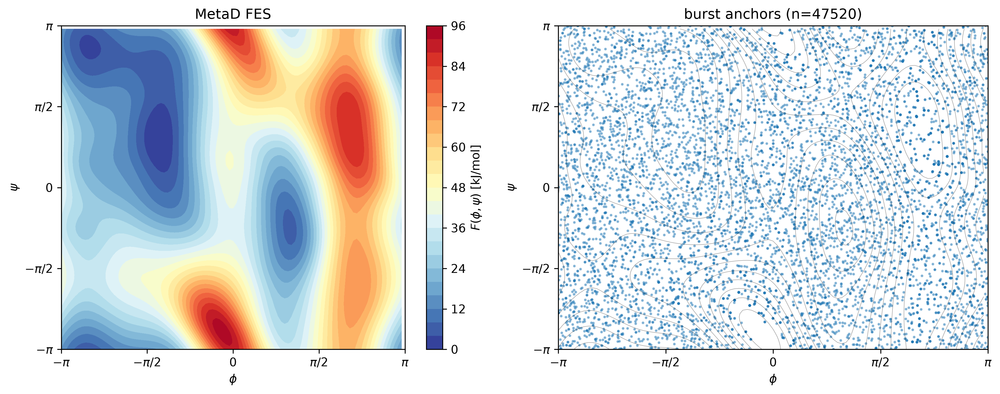

In [2]:
have = all(os.path.exists(f"{SCRATCH}/{f}.npy")
           for f in ["X0", "Xtau", "metad_fes", "metad_axes", "phi0", "psi0", "phitau", "psitau"])
if not have:
    gen_data.generate(SCRATCH, metad_ns=METAD_NS, max_per_cell=MAX_PER_CELL, procs=PROCS)
X0   = np.load(f"{SCRATCH}/X0.npy");   Xtau = np.load(f"{SCRATCH}/Xtau.npy")
fes  = np.load(f"{SCRATCH}/metad_fes.npy"); axis = np.load(f"{SCRATCH}/metad_axes.npy")
phi0 = np.load(f"{SCRATCH}/phi0.npy");  psi0 = np.load(f"{SCRATCH}/psi0.npy")
ss   = np.random.default_rng(0).choice(len(X0), min(8000, len(X0)), replace=False)
print(f"{len(X0)} anchors, FES {fes.shape}, 0–{fes.max():.0f} kJ/mol")

fig, ax = plt.subplots(1, 2, figsize=(12, 4.8))
cf = ax[0].contourf(axis, axis, fes, levels=30, cmap="RdYlBu_r")
plt.colorbar(cf, ax=ax[0], label=r"$F(\phi,\psi)$ [kJ/mol]")
ax[0].set_title("MetaD FES"); rama(ax[0])
ax[1].contour(axis, axis, fes, levels=12, colors="k", linewidths=0.3, alpha=0.5)
ax[1].scatter(phi0[ss], psi0[ss], s=2, alpha=0.4, color="C0", rasterized=True)
ax[1].set_title(f"burst anchors (n={len(X0)})"); rama(ax[1])
plt.tight_layout(); plt.show()

## 2 · ISOKANN — three softmax memberships (ISA)

`ChiNetMulti` (softmax head) trained with the ISA isotarget, no warm-up — three live
memberships from a random init.

loaded cached ISOKANN model
k_eff = 3  centroids: ['χ1=(φ+0.95,ψ-0.45)', 'χ2=(φ-1.43,ψ-0.55)', 'χ3=(φ+2.88,ψ+3.01)']


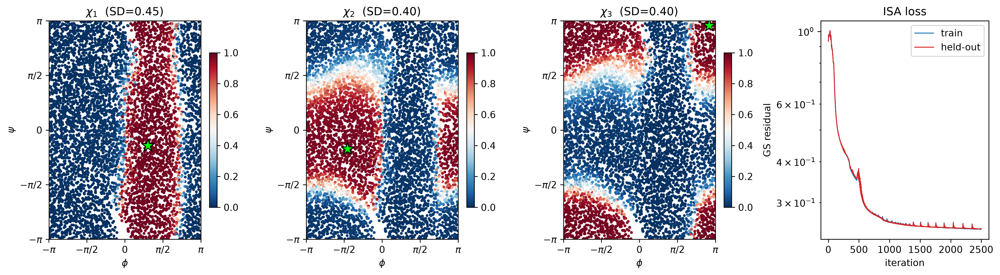

In [3]:
feat   = pl.featurize_np(X0).numpy()
bursts = pl.featurize_np(Xtau).numpy()[:, None, :]
ckpt = f"{SCRATCH}/isokann_k3.pt"
if os.path.exists(ckpt) and os.path.exists(f"{SCRATCH}/chi.npy"):
    model = ChiNetMulti(231, 3, hidden=[128, 32, 8]); model.load_state_dict(pt.load(ckpt))
    chi = np.load(f"{SCRATCH}/chi.npy")
    loss_tr = np.load(f"{SCRATCH}/loss_train.npy"); loss_val = np.load(f"{SCRATCH}/loss_val.npy")
    print("loaded cached ISOKANN model")
else:
    idx = (np.random.default_rng(0).choice(len(feat), MAX_ANCHORS, replace=False)
           if len(feat) > MAX_ANCHORS else np.arange(len(feat)))
    res = pl.train_isokann_isa(feat[idx], bursts[idx], k=3, max_iter=TRAIN_ITERS, min_iter=600)
    model = res["net"]
    with pt.no_grad(): chi = model(pt.tensor(feat)).numpy()
    loss_tr, loss_val = res["loss_train"], res["loss_val"]
    pt.save(model.state_dict(), ckpt); np.save(f"{SCRATCH}/chi.npy", chi)
    np.save(f"{SCRATCH}/loss_train.npy", loss_tr); np.save(f"{SCRATCH}/loss_val.npy", loss_val)
model.eval()
cent = pl.state_centroids(chi, phi0, psi0)
SLAB = [f"$\\chi_{j+1}$" for j in range(3)]
print("k_eff =", int((chi.std(0) > 0.05).sum()),
      " centroids:", [f"χ{j+1}=(φ{cent[j,0]:+.2f},ψ{cent[j,1]:+.2f})" for j in range(3)])

fig = plt.figure(figsize=(15, 4.2))
for j in range(3):
    ax = fig.add_subplot(1, 4, j + 1)
    sc = ax.scatter(phi0[ss], psi0[ss], c=chi[ss, j], s=4, cmap="RdBu_r", vmin=0, vmax=1, rasterized=True)
    ax.scatter(*cent[j], marker="*", s=200, c="lime", edgecolor="k", zorder=5)
    plt.colorbar(sc, ax=ax, fraction=0.046)
    ax.set_title(f"{SLAB[j]}  (SD={chi[:,j].std():.2f})"); rama(ax)
axl = fig.add_subplot(1, 4, 4)
axl.plot(loss_tr, color="tab:blue", lw=1, label="train"); axl.plot(loss_val, color="tab:red", lw=1, label="held-out")
axl.set_yscale("log"); axl.set_xlabel("iteration"); axl.set_ylabel("GS residual"); axl.set_title("ISA loss"); axl.legend()
plt.tight_layout(); plt.show()

## 3 · The membership simplex and the edge maps

Left: the membership triangle $\Delta^2$ — anchors coloured by FES collapse to the three
**vertices** (the metastable states) and thin out toward the **edges** (transitions).  Right:
each edge's reaction coordinate $s=\tfrac12(\chi_i-\chi_j+1)$ on $(\phi,\psi)$, opacity =
edge activity $\chi_i+\chi_j$ (so the third basin — which also has $s=\tfrac12$ — fades out and
the white band is unambiguously the $i\!\leftrightarrow\!j$ separatrix).

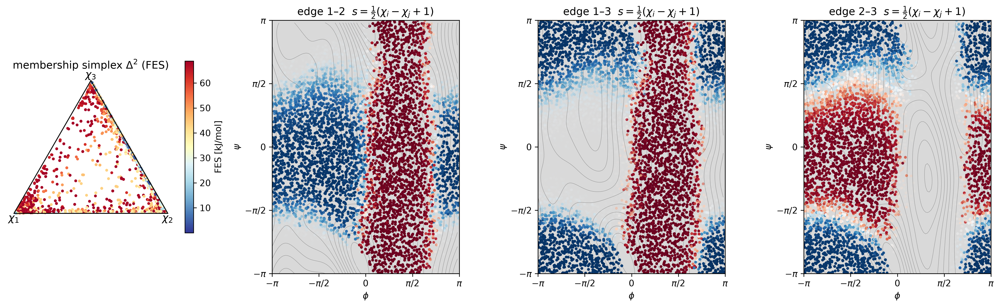

In [4]:
Fa = pl.fes_along_path(fes, axis, X0[ss])
fig = plt.figure(figsize=(16, 5))
axt = fig.add_subplot(1, 4, 1)
tx, ty = tri(chi[ss])
sc = axt.scatter(tx, ty, c=Fa, s=5, cmap="RdYlBu_r", vmax=np.nanpercentile(Fa, 90), rasterized=True)
V = np.array([[0, 0], [1, 0], [0.5, np.sqrt(3)/2]])
for a, b in [(0, 1), (1, 2), (2, 0)]:
    axt.plot([V[a,0], V[b,0]], [V[a,1], V[b,1]], "k-", lw=1)
for v, nm in zip(V, SLAB):
    axt.annotate(nm, v, fontsize=12, ha="center", va="bottom" if v[1] > 0 else "top", fontweight="bold")
axt.set_aspect("equal"); axt.axis("off"); axt.set_title("membership simplex $\\Delta^2$ (FES)")
plt.colorbar(sc, ax=axt, fraction=0.046, label="FES [kJ/mol]")
for c, (i, j) in enumerate(EDGES):
    ax = fig.add_subplot(1, 4, c + 2)
    s = 0.5 * (chi[:, i] - chi[:, j] + 1.0); w = np.clip(chi[:, i] + chi[:, j], 0, 1)
    rgba = plt.cm.RdBu_r(s[ss]); rgba[:, 3] = w[ss]
    ax.set_facecolor("0.85")
    ax.scatter(phi0[ss], psi0[ss], c=rgba, s=5, rasterized=True)
    ax.contour(axis, axis, fes, levels=12, colors="k", linewidths=0.3, alpha=0.4)
    ax.set_title(EDGE_LABEL[(i, j)] + r"  $s=\frac{1}{2}(\chi_i-\chi_j+1)$"); rama(ax)
plt.tight_layout(); plt.show()

## 4 · Membership pathways and a-posteriori edge realisation

Seeds are membership transition frames ($\chi_i\approx\tfrac12$), **lightly** prepared
(short minimisation + orthogonal-sampling equilibration — no constraint; $\chi_i=\tfrac12$
carries no basin).  From each seed we integrate the membership flow $\nabla\chi_i$ with three
liftings, then **realise the edge** of every path from its $\chi_i\!\approx\!0$ end.

In [5]:
cache = f"{SCRATCH}/pathways.pkl"
if os.path.exists(cache):
    with open(cache, "rb") as f:
        D = pickle.load(f)
    prepared, results = D["prepared"], D["results"]
    print("loaded cached pathways")
else:
    # 1) membership seeds (χ_i=½), minimised + equilibrated in parallel (cached separately)
    prep_cache = f"{SCRATCH}/prep_seeds.npy"
    if os.path.exists(prep_cache):
        prepared = np.load(prep_cache, allow_pickle=True).item()
        print("loaded cached prepared seeds")
    else:
        raw = {}
        for i in STATES:
            fr, _ = separatrix_frames(model, pl.featurizer, X0, i, None)
            idx = np.random.default_rng(i).choice(len(fr), min(N_PREP, len(fr)), replace=False)
            raw[i] = fr[idx]
        ptasks = [(i, "prep", "face", i, None, x.astype(np.float64),
                   dict(min_iter=SEED_MIN, equil_steps=SEED_EQUIL))
                  for i in STATES for x in raw[i]]
        print(f"preparing {len(ptasks)} seeds ...")
        t0 = time.time()
        pr = pl.run_ensemble(model, 231, 3, [128, 32, 8], ptasks, procs=PROCS)
        prepared = defaultdict(list)
        for i, xm in pr: prepared[i].append(np.asarray(xm))
        prepared = {i: np.array(prepared[i]) for i in STATES}
        np.save(prep_cache, prepared, allow_pickle=True)
        print(f"  prep {time.time()-t0:.0f}s")
    # 2) pathway tasks — ALL three liftings run from the IDENTICAL prepared seed set
    #    (energy-free needs sensible seeds, so MEP/MFEP/EF share exactly the same seeds).
    tasks = []
    for i in STATES:
        for x in prepared[i]:
            tasks.append((("mep", i), "mep", "face", i, None, x, dict(steps=MEP_STEPS, energy_max_iter=25)))
            tasks.append((("mfep", i), "mfep", "face", i, None, x, dict(steps=MFEP_STEPS, steps_per_levelset=MFEP_LS)))
            tasks.append((("ef", i), "ef", "face", i, None, x, dict(steps=EF_STEPS, steps_per_levelset=EF_LS)))
    print(f"integrating {len(tasks)} pathways ...")
    t0 = time.time()
    raw_out = pl.run_ensemble(model, 231, 3, [128, 32, 8], tasks, procs=PROCS)
    print(f"  pathways {time.time()-t0:.0f}s")
    results = defaultdict(list)
    for gid, res in raw_out: results[gid].append(res)
    results = dict(results)
    with open(cache, "wb") as f:
        pickle.dump({"prepared": prepared, "results": results}, f)

# realise the edge of every path (a-posteriori) → group by (method, edge)
by_edge = defaultdict(lambda: defaultdict(list))   # method -> edge -> [coords...]
for (method, i), reslist in results.items():
    for res in reslist:
        pc = pl.path_coords(res)
        e = pl.edge_of_path(model, pc, i)
        by_edge[method][e].append(pc)
for m in ["mep", "mfep", "ef"]:
    print(m, {EDGE_LABEL[e]: len(by_edge[m].get(e, [])) for e in EDGES})

loaded cached pathways


mep {'edge 1–2': 45, 'edge 1–3': 16, 'edge 2–3': 83}
mfep {'edge 1–2': 45, 'edge 1–3': 16, 'edge 2–3': 83}
ef {'edge 1–2': 45, 'edge 1–3': 16, 'edge 2–3': 83}


### 4.1 · Edge-realised pathways on the FES

Columns = lifting strategy; every path is coloured by the **edge it realises** (a-posteriori).
For each method+edge the ensemble is clustered by a level-set-aligned path metric and the
**medoid tubes** are drawn bold over the faint ensemble — so parallel routes show up as
separate tubes (e.g. the two C7ax channels, ψ>0 and ψ<0, of edge 2–3).

medoid tubes: {'edge 1–2': 3, 'edge 1–3': 1, 'edge 2–3': 2}


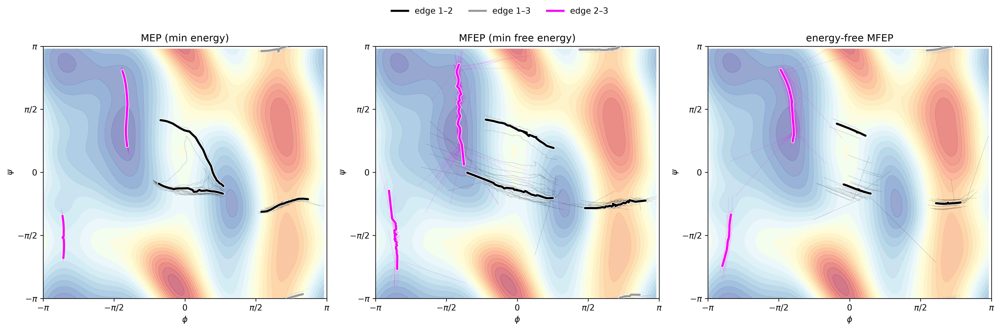

In [6]:
METHODS = [("mep", "MEP (min energy)"), ("mfep", "MFEP (min free energy)"), ("ef", "energy-free MFEP")]
CLUST_THRESH = 0.8         # absolute path-metric threshold ≈ RMS (phi,psi) separation [rad];
                           # resolves parallel routes robustly across edges (vs a relative one)
medoids_by = {}            # (method, edge) -> list of medoid path coords

def cluster_medoids(m, e):
    paths = by_edge[m].get(e, [])
    if not paths:
        return [], []
    cv = [np.array([pl._chi_val(EdgeCV(model, *e), pl.featurizer, p[t]) for t in range(len(p))]) for p in paths]
    _, med = pl.cluster_paths(paths, cv, thresh=CLUST_THRESH, min_size=2)
    return paths, [paths[k] for k in med]

fig, axes = plt.subplots(1, 3, figsize=(17, 5.6))
for c, (m, mlab) in enumerate(METHODS):
    ax = axes[c]; ax.contourf(axis, axis, fes, levels=30, cmap="RdYlBu_r", alpha=0.55)
    for e in EDGES:
        paths, meds = cluster_medoids(m, e)
        medoids_by[(m, e)] = meds
        for p in paths: pl.plot_path(ax, p, color=EDGE_COLOR[e], lw=0.5, alpha=0.18, halo=False)
        for p in meds:  pl.plot_path(ax, p, color=EDGE_COLOR[e], lw=2.6, zorder=5)
    ax.set_title(f"{mlab}"); rama(ax)
ef_medoids = {e: medoids_by.get(("ef", e), []) for e in EDGES}
print("medoid tubes:", {EDGE_LABEL[e]: len(medoids_by.get(("ef", e), [])) for e in EDGES})
import matplotlib.lines as mlines
fig.legend(handles=[mlines.Line2D([], [], color=EDGE_COLOR[e], lw=2.5, label=EDGE_LABEL[e]) for e in EDGES],
           loc="upper center", ncol=3, fontsize=10, frameon=False)
plt.tight_layout(rect=[0, 0, 1, 0.93]); plt.show()

### 4.2 · The pathways on the simplex

The same paths in membership space — each runs from a vertex (state) along an edge to another
vertex, confirming the edge realisation.

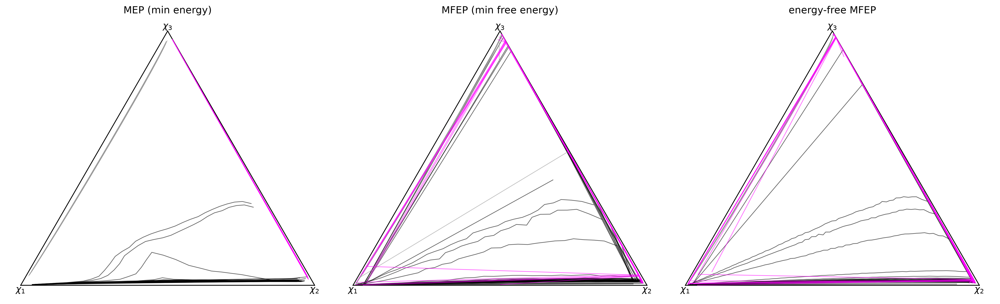

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5.6))
V = np.array([[0, 0], [1, 0], [0.5, np.sqrt(3)/2]])
for c, (m, mlab) in enumerate(METHODS):
    ax = axes[c]
    for a, b in [(0, 1), (1, 2), (2, 0)]:
        ax.plot([V[a,0], V[b,0]], [V[a,1], V[b,1]], "k-", lw=1, zorder=1)
    for v, nm in zip(V, SLAB):
        ax.annotate(nm, v, fontsize=11, ha="center", va="bottom" if v[1] > 0 else "top", fontweight="bold")
    for e in EDGES:
        for p in by_edge[m].get(e, []):
            with pt.no_grad():
                cc = model(pl.featurize_np(p)).numpy()
            tx, ty = tri(cc); ax.plot(tx, ty, color=EDGE_COLOR[e], lw=0.8, alpha=0.6)
    ax.set_aspect("equal"); ax.axis("off"); ax.set_title(mlab)
plt.tight_layout(); plt.show()

## 5 · Free energy per tube vs metadynamics

**MFEP** gives a genuine PMF $F(s)$ along each edge (TI of the mean force + Fixman, restricted
to the well-conditioned interior).  For every tube we also read the **MetaD FES along the medoid
path** (the *a posteriori* lift used by the energy-free method).  One panel per edge.

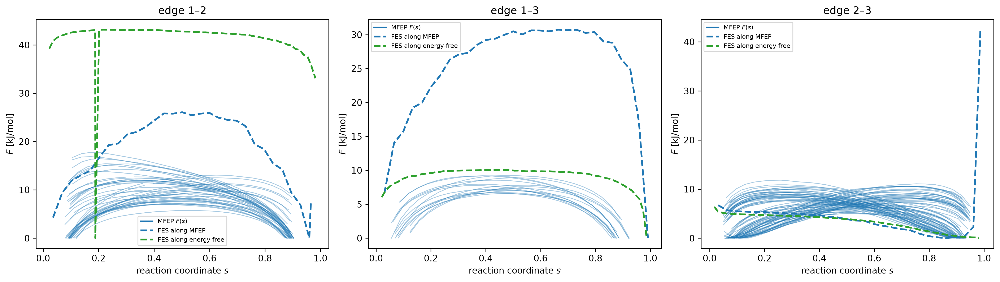

      edge   MFEP ΔF‡  MetaD ΔF (tube)
  edge 1–2       17.8             43.2
  edge 1–3        9.2             10.1
  edge 2–3       11.8              6.4


In [8]:
def medoid_for(method, e):
    paths = by_edge[method].get(e, [])
    if not paths: return None
    if method == "ef": return ef_medoids.get(e, paths)[0]
    return paths[0]

fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
rows = []
for c, e in enumerate(EDGES):
    ax = axes[c]
    mfeps = [r for r in results.get(("mfep", e[0]), []) if pl.edge_of_path(model, pl.path_coords(r), e[0]) == e]
    mfeps += [r for r in results.get(("mfep", e[1]), []) if pl.edge_of_path(model, pl.path_coords(r), e[1]) == e]
    dF = np.nan
    for r in mfeps:
        pmf = pl.robust_pmf(r, 300.0)
        ax.plot(pmf["cv"], pmf["F_free"], color="tab:blue", lw=0.8, alpha=0.4)
        dF = np.nanmax([dF, pmf["F_dagger"]])
    if mfeps: ax.plot([], [], color="tab:blue", lw=1.5, label="MFEP $F(s)$")
    dF_fes = np.nan
    for method, col, lab in [("mfep", "tab:blue", "FES along MFEP"), ("ef", "tab:green", "FES along energy-free")]:
        med = medoid_for(method, e)
        if med is None: continue
        pc = pl.path_coords(med)
        s = np.array([pl._chi_val(EdgeCV(model, *e), pl.featurizer, pc[t]) for t in range(len(pc))])
        Fm = pl.fes_along_path(fes, axis, pc); Fm = Fm - np.nanmin(Fm); o = np.argsort(s)
        ax.plot(s[o], Fm[o], col, ls="--", lw=2.0, label=lab)
        if method == "ef": dF_fes = float(np.nanmax(Fm) - np.nanmin(Fm))
    ax.set_title(EDGE_LABEL[e]); ax.set_xlabel("reaction coordinate $s$"); ax.set_ylabel(r"$F$ [kJ/mol]")
    ax.legend(fontsize=7)
    rows.append((EDGE_LABEL[e], dF, dF_fes))
plt.tight_layout(); plt.show()
print(f"{'edge':>10s} {'MFEP ΔF‡':>10s} {'MetaD ΔF (tube)':>16s}")
for lab, a, b in rows: print(f"{lab:>10s} {a:10.1f} {b:16.1f}")

## 6 · Sensitivity

Per-atom $\langle\lVert\nabla_x s\rVert^2\rangle$ for each edge coordinate (left, global) and
resolved **along** an edge (right, binned by $s$).  The $\phi,\psi$ backbone atoms dominate.

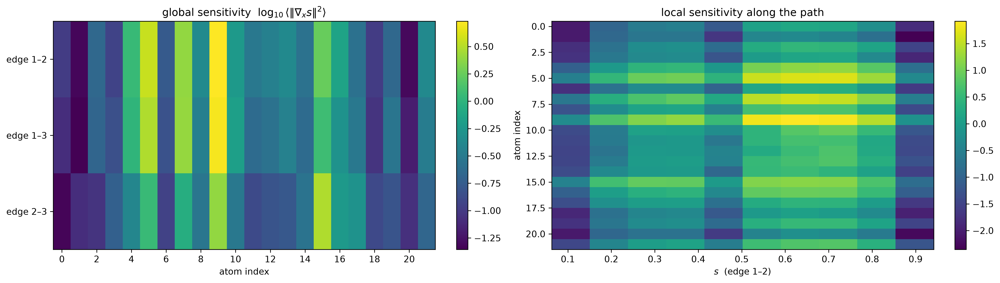

In [9]:
S = []
for (i, j) in EDGES:
    _, sens = pl.direction_sensitivity(EdgeCV(model, i, j), X0, nbins=1, max_pts=1500)
    S.append(sens[0])
S = np.array(S)
fig, ax = plt.subplots(1, 2, figsize=(16, 4.6))
im0 = ax[0].imshow(np.log10(S + 1e-6), aspect="auto", cmap="viridis")
ax[0].set_yticks(range(3)); ax[0].set_yticklabels([EDGE_LABEL[e] for e in EDGES])
ax[0].set_xlabel("atom index"); ax[0].set_xticks(range(0, 22, 2))
ax[0].set_title(r"global sensitivity  $\log_{10}\langle\|\nabla_x s\|^2\rangle$")
plt.colorbar(im0, ax=ax[0], fraction=0.046)
centers, sloc = pl.direction_sensitivity(EdgeCV(model, *EDGES[0]), X0, nbins=10, max_pts=4000)
im1 = ax[1].imshow(np.log10(sloc.T + 1e-6), aspect="auto", cmap="viridis",
                   extent=[centers.min(), centers.max(), 21.5, -0.5])
ax[1].set_xlabel(f"$s$  ({EDGE_LABEL[EDGES[0]]})"); ax[1].set_ylabel("atom index")
ax[1].set_title("local sensitivity along the path")
plt.colorbar(im1, ax=ax[1], fraction=0.046)
plt.tight_layout(); plt.show()

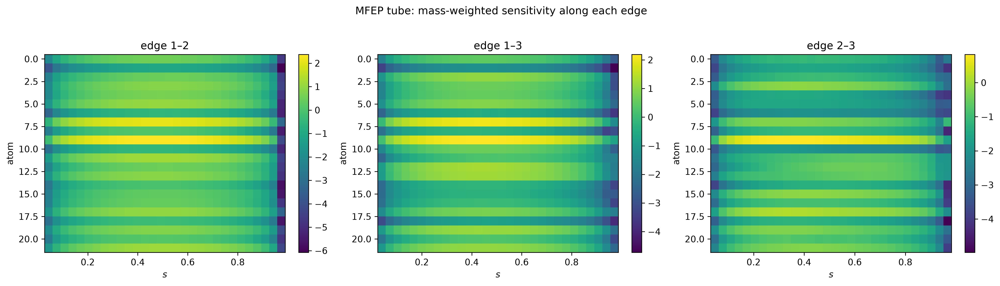

In [10]:
# sensitivity along the MFEP tube (per-image mass-weighted ‖∇s‖² per atom), per edge
fig, axes = plt.subplots(1, 3, figsize=(16, 4.4))
for c, e in enumerate(EDGES):
    ax = axes[c]
    med = None
    for i in e:
        cand = [r for r in results.get(("mfep", i), []) if pl.edge_of_path(model, pl.path_coords(r), i) == e]
        if cand: med = cand[0]; break
    if med is None: ax.axis("off"); ax.set_title(EDGE_LABEL[e] + " (none)"); continue
    sens = med["sensitivity"]; cv = np.array(med["cv_values"]); o = np.argsort(cv)
    im = ax.imshow(np.log10(sens[o].T + 1e-9), aspect="auto", cmap="viridis",
                   extent=[cv[o].min(), cv[o].max(), 21.5, -0.5])
    ax.set_title(EDGE_LABEL[e]); ax.set_xlabel("$s$"); ax.set_ylabel("atom")
    plt.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle("MFEP tube: mass-weighted sensitivity along each edge", y=1.02)
plt.tight_layout(); plt.show()

## Notes

* **Membership flow is the object.** $\nabla\chi_i$ has no $\tfrac12$ degeneracy (basins sit at
  $\chi_i\in\{0,1\}$), so seeds and paths never slide into a foreign basin; the **edge** is an
  a-posteriori label of the two states a path connects.  No activity constraint is needed —
  only a *light* seed prep (an over-aggressive minimisation at the edge saddle $s=\tfrac12$ is
  what would find the third basin, because that basin lies only on the $s=\tfrac12$ level set).
* **Energy-free MFEP** uses a minimal number of orthogonal steps per level set and lifts the
  free energy from the FES a posteriori; clustering separates parallel routes per edge.
* **FES registration.** `fes[psi, phi]`, plotted `contourf(phi_axis, psi_axis, fes)`; paths use
  the same `adp_phi`/`adp_psi`, with ±π wraps broken (`pl.plot_path`).